<h1><font color="black">ECE 2372: HW1</font></h1>

<h2><font color="black">Problem 1a</font></h2>

In [1]:
def calculate_probability(p, n, m):
    # Calculate the probability of getting at least one head
    prob_at_least_one_head = 1 - (1 - p) ** n
    
    # Calculate the probability that all coins will have at least one head
    prob_all_heads = prob_at_least_one_head ** m
    
    # Calculate the probability that at least one coin out of m will have no heads
    prob_at_least_one_no_head = 1 - prob_all_heads
    
    return prob_at_least_one_no_head

# Main method
if __name__ == "__main__":
    # Define the parameters
    p_values = [0.04, 0.75]
    m_values = [1, 1000, 1000000]
    n = 10

    # Print the header row
    print("p\tm\tProbability")

    # Loop through each combination of p and m
    for p in p_values:
        for m in m_values:
            # Calculate the probability
            probability = calculate_probability(p, n, m)
            print(f"{p}\t{m}\t{probability}")


p	m	Probability
0.04	1	0.6648326359915008
0.04	1000	1.0
0.04	1000000	1.0
0.75	1	9.5367431640625e-07
0.75	1000	0.0009532201678953411
0.75	1000000	0.6146775532338038


<h2><font color="black">Problem 1b</font></h2>

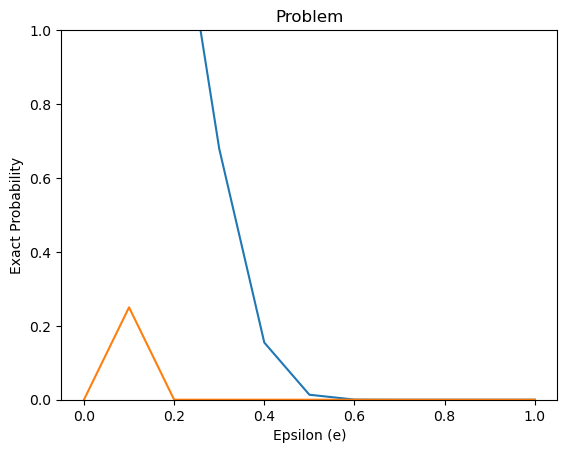

In [2]:
import math as math
import numpy as np 
import matplotlib.pyplot as plt

def exact_probability(p, n, m, epsilon):
    # Calculate the probability of getting at least one head
    prob_at_least_one_head = 1 - (1 - p) ** n

    # Calculate the probability that all coins will have at least one head
    prob_all_heads = prob_at_least_one_head ** m
    
    # Calculate the probability that at least one coin out of m will have no heads
    prob_at_least_one_no_head = 1 - prob_all_heads

    total_prob = 0
    test = abs(prob_at_least_one_no_head - p)
    if test > epsilon:
        total_prob = prob_at_least_one_no_head

    return total_prob

def hoeffding_bound(epsilon, n, m):
    """
    Calculate Hoeffding's bound given epsilon, the number of trials n, and the number of coins m.
    """
    return 2 * math.exp(-2 * epsilon**2 * n * m)

# Main method
if __name__ == "__main__":
    # Define the parameters
    p = 0.5
    n = 2
    m_list = [0,1,2,3,4,5,6,7,8,9,10]
    epsilon = np.linspace(0, 1, len(m_list))
    bound = np.zeros(epsilon.shape)
    exact_prob = np.zeros(epsilon.shape)

    for i in range(10):
        bound[i] = hoeffding_bound(epsilon[i], n, m_list[i])
        exact_prob[i] = exact_probability(p, n, m_list[i], epsilon[i])

    plt.plot(epsilon, bound)
    plt.plot(epsilon, exact_prob)

    # Plot
    plt.xlabel('Epsilon (e)')
    plt.ylabel('Exact Probability')
    plt.title('Problem')
    plt.ylim(0,1)
    plt.show()


<h2><font color="black">Problem 2</font></h2>

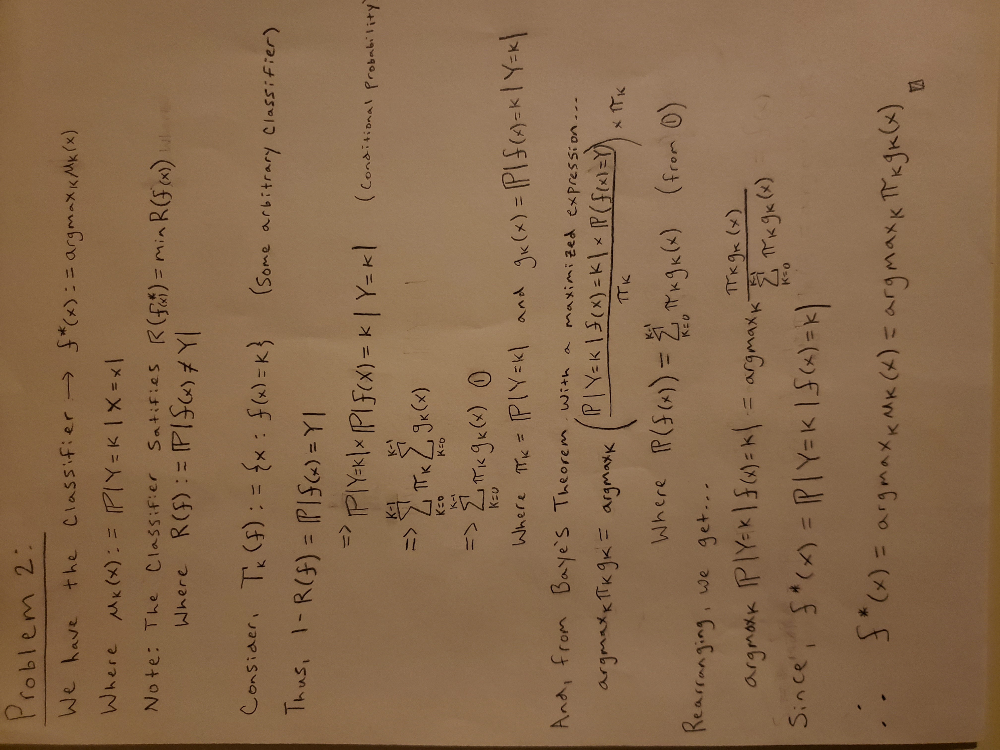

<h2><font color="black">Problem 3a</font></h2>

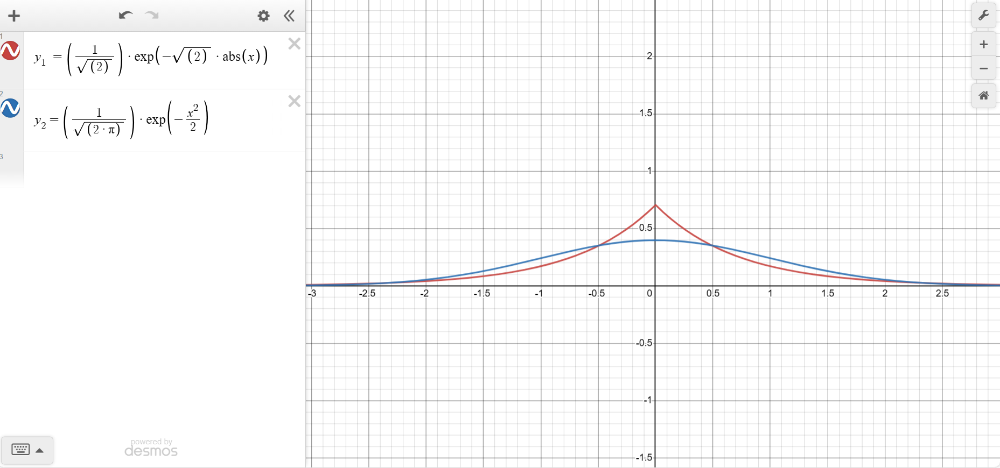

<h2><font color="black">Problem 3b</font></h2>

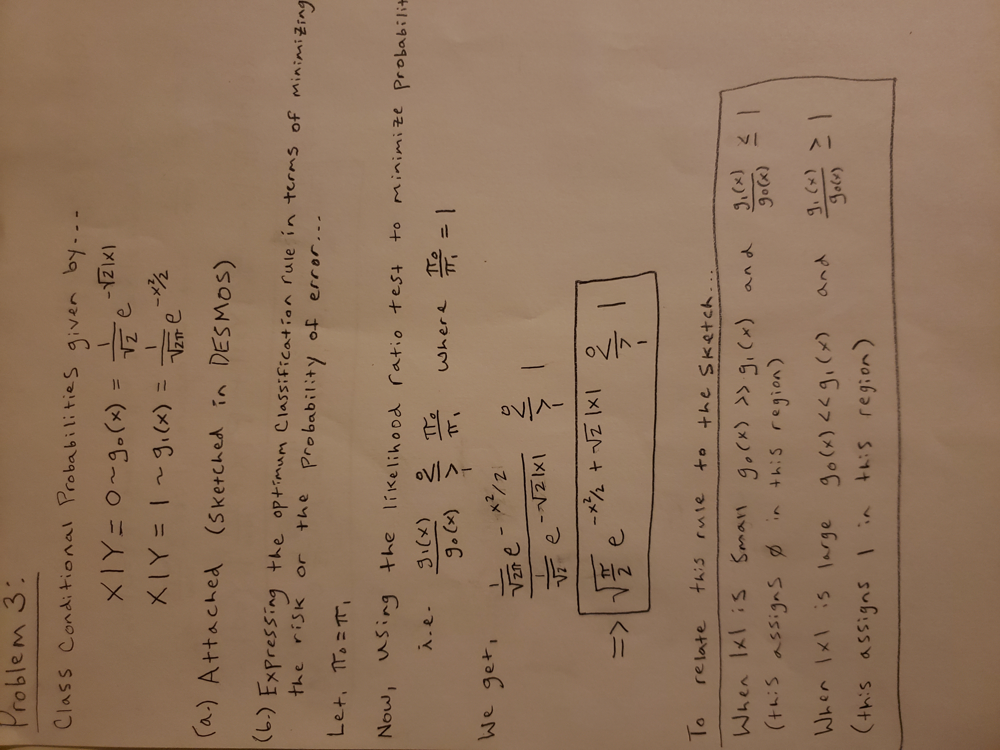

<h2><font color="black">Problem 3c</font></h2>

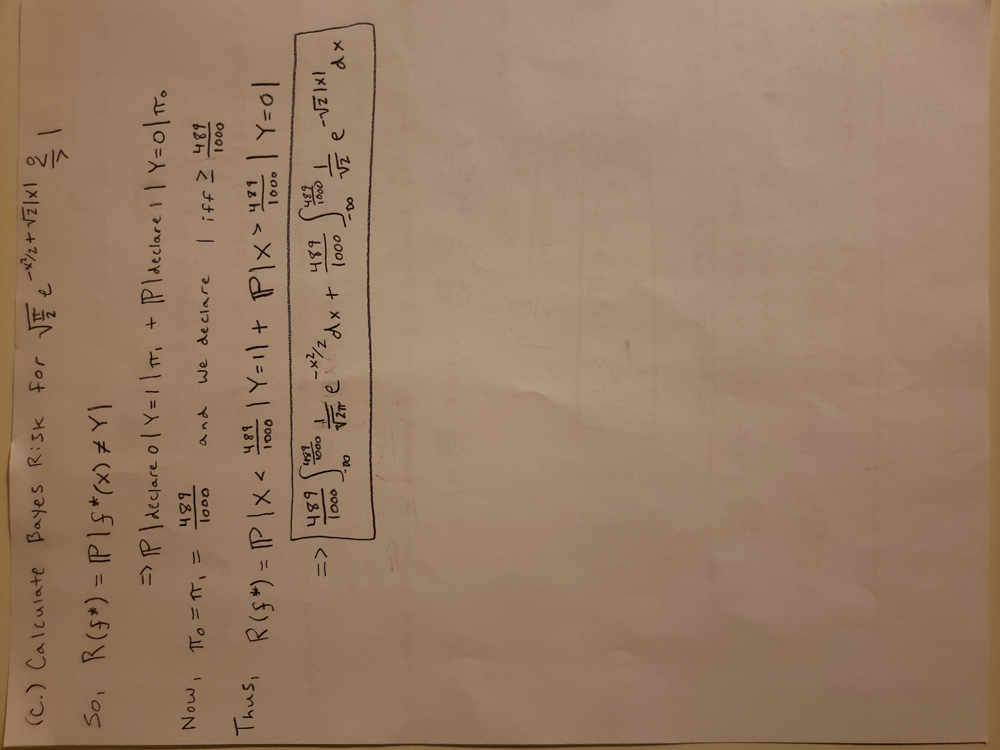

<h2><font color="black">Problem 4</font></h2>

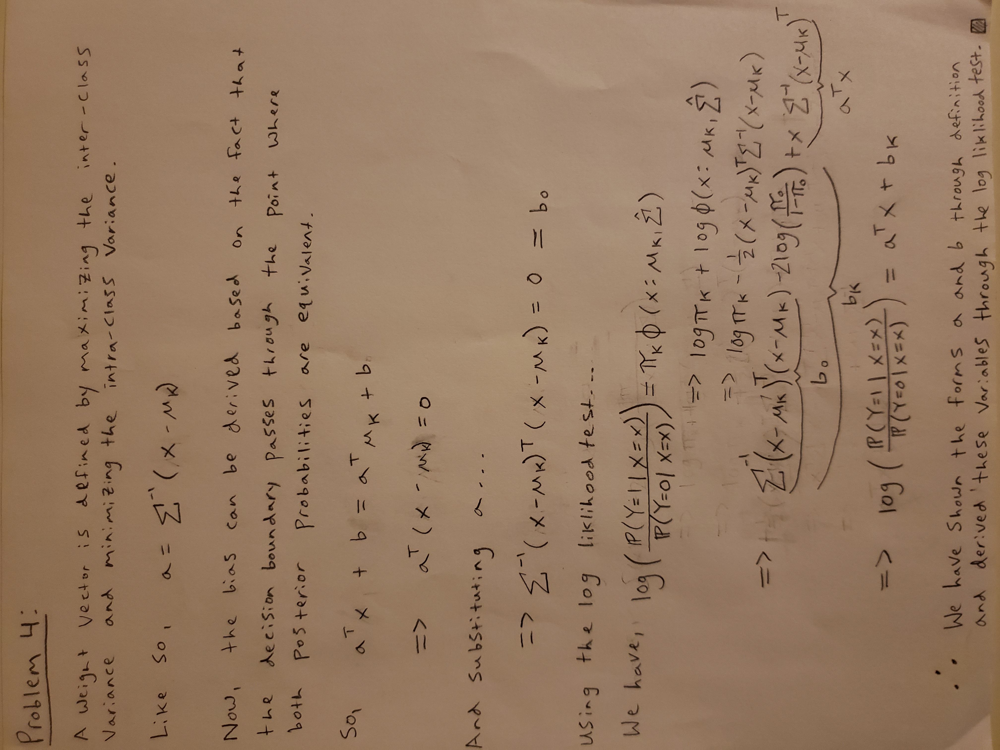

<h2><font color="black">Problem 5 (a,b,c,d)</font></h2>

In [3]:
import numpy as np
import scipy.io

class LinearDiscriminantAnalysis:
    def __init__(self):
        self.mean_0 = None
        self.mean_1 = None
        self.prior_0 = None
        self.prior_1 = None
        self.shared_cov = None
        self.a = None
        self.b = None

    # We want to compute (a^T)*x + b < 0,0,1
    def fit(self, X, Y):
        # Reshape Y to ensure it has the correct shape
        Y = Y.ravel()
        # Compute the prior probabilities
        self.prior_0 = X[:, Y == 0]
        self.prior_1 = X[:, Y == 1]
        self.prior_0 = self.prior_0.T
        self.prior_1 = self.prior_1.T

        # Compute means
        self.mean_0 = np.mean(self.prior_0, axis=0)
        self.mean_1 = np.mean(self.prior_1, axis=0)

        # Compute covariance matrix
        cov_0 = np.cov(self.prior_0.T)
        cov_1 = np.cov(self.prior_1.T)
        self.shared_cov = (cov_0 + cov_1)

        # Compute a
        self.a = np.dot(np.linalg.inv(self.shared_cov), (self.mean_0 - self.mean_1))

        # Compute b, where @ is the np.matmul operator
        b1 = -0.5 * self.mean_0.T @ np.linalg.inv(self.shared_cov) @ self.mean_0
        b2 = 0.5 * self.mean_1.T @ np.linalg.inv(self.shared_cov) @ self.mean_1
        b3 = np.log(len(self.prior_1) / len(self.prior_0))
        self.b = b1 + b2 + b3

    def fit_modified(self, X, Y):
        # Reshape Y to ensure it has the correct shape
        Y = Y.ravel()
        # Compute the prior probabilities
        self.prior_0 = X[:, Y == 0]
        self.prior_1 = X[:, Y == 1]
        self.prior_0 = self.prior_0.T
        self.prior_1 = self.prior_1.T

        # Compute means
        self.mean_0 = np.mean(self.prior_0, axis=0)
        self.mean_1 = np.mean(self.prior_1, axis=0)

        # Compute covariance matrix and modify to structures covariance
        d = X.shape[0]
        cov_0 = np.cov(self.prior_0.T)
        cov_1 = np.cov(self.prior_1.T)
        trace_cov = np.trace(cov_0 + cov_1)
        sigma_squared = trace_cov / d
        self.shared_cov = sigma_squared * np.eye(d)

        # Compute a
        self.a = np.dot(np.linalg.inv(self.shared_cov), (self.mean_0 - self.mean_1))

        # Compute b, where @ is the np.matmul operator
        b1 = -0.5 * (self.mean_0.T @ np.linalg.inv(self.shared_cov) @ self.mean_0)
        b2 = 0.5 * (self.mean_1.T @ np.linalg.inv(self.shared_cov) @ self.mean_1)
        b3 = np.log(len(self.prior_1) / len(self.prior_0))
        self.b = b1 + b2 + b3

    def predict(self, X):
        y_out = (X.T @ self.a) + self.b
        return np.where(y_out >= 0, 1, 0)

# Main method
if __name__ == "__main__":
    # Load MATLAB file data
    mat_data1 = scipy.io.loadmat('synthetic1.mat')
    mat_data2 = scipy.io.loadmat('synthetic2.mat')
    mat_data3 = scipy.io.loadmat('synthetic3.mat')
    mat_data4 = scipy.io.loadmat('synthetic4.mat')
    mat_datatest = scipy.io.loadmat('testLDA.mat')
    mat_datatrain = scipy.io.loadmat('trainTrain.mat')

    # Access variables in the MATLAB files
    X1 = mat_data1['X']
    Y1 = mat_data1['Y']

    X2 = mat_data2['X']
    Y2 = mat_data2['Y']
    w = mat_data2['w']
    b = mat_data2['b']

    X3 = mat_data3['X']
    Y3 = mat_data3['Y']

    X4 = mat_data4['X']
    Y4 = mat_data4['Y']

    Xtest = mat_datatest['Xtest']
    Ytest = mat_datatest['Ytest']

    Xtrain = mat_datatrain['Xtrain']
    Ytrain = mat_datatrain['Ytrain']

    # Use LDA model
    lda = LinearDiscriminantAnalysis()
    
    lda.fit(X1, Y1)
    y_out = lda.predict(X1)
    # Calculate error for LDA
    error = y_out != Y1
    percent_error = np.mean(error == Y1)*100
    print("Error for synthetic 1:", percent_error)

    lda.fit_modified(X1, Y1)
    y_out =lda.predict(X1)
    # Calculate error for modified LDA
    error = y_out != Y1
    percent_error = np.mean(error == Y1)*100
    print("Error for synthetic 1 modified:", percent_error)

    lda.fit(X2, Y2)
    y_out = lda.predict(X2)
    # Calculate error for LDA
    error = y_out != Y2
    percent_error = np.mean(error == Y2)*100
    print("Error for synthetic 2:", percent_error)

    lda.fit_modified(X2, Y2)
    y_out = lda.predict(X2)
    # Calculate error for modified LDA
    error = y_out != Y2
    percent_error = np.mean(error == Y2)*100
    print("Error for synthetic 2 modified:", percent_error)

    lda.fit(X3, Y3)
    y_out = lda.predict(X3)
    # Calculate error for LDA
    error = y_out != Y3
    percent_error = np.mean(error == Y3)*100
    print("Error for synthetic 3:", percent_error)

    lda.fit_modified(X3, Y3)
    y_out = lda.predict(X3)
    # Calculate error for modified LDA
    error = y_out != Y3
    percent_error = np.mean(error == Y3)*100
    print("Error for synthetic 3 modified:", percent_error)

    lda.fit(X4, Y4)
    y_out = lda.predict(X4)
    # Calculate error for LDA
    error = y_out != Y4
    percent_error = np.mean(error == Y4)*100
    print("Error for synthetic 4:", percent_error)

    lda.fit_modified(X4, Y4)
    y_out = lda.predict(X4)
    # Calculate error for modified LDA
    error = y_out != Y4
    percent_error = np.mean(error == Y4)*100
    print("Error for synthetic 4 modified:", percent_error)

    lda.fit(Xtrain, Ytrain)
    y_out = lda.predict(Xtest)
    # Calculate error for LDA
    error = y_out != Ytest
    #x = abs(y_out-Ytest)
    #percent_error = np.mean(x == Ytest)*100
    percent_error = np.mean(error == Ytest)*100
    print("Error for training/test set:", percent_error)

    lda.fit_modified(Xtrain, Ytrain)
    y_out = lda.predict(Xtest)
    # Calculate error for modified LDA
    error = y_out != Ytest
    percent_error = np.mean(error == Ytest)*100
    print("Error for training/test set:", percent_error)


Error for synthetic 1: 50.0
Error for synthetic 1 modified: 50.0
Error for synthetic 2: 49.5
Error for synthetic 2 modified: 50.0
Error for synthetic 3: 49.0
Error for synthetic 3 modified: 44.0
Error for synthetic 4: 57.49999999999999
Error for synthetic 4 modified: 64.5
Error for training/test set: 74.89177489177489
Error for training/test set: 72.2943722943723
